In [1]:
######Setting GPU environment for tensorflow
%tensorflow_version 2.x
import tensorflow as tf
import timeit

device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  print(
      '\n\nThis error most likely means that this notebook is not '
      'configured to use a GPU.  Change this in Notebook Settings via the '
      'command palette (cmd/ctrl-shift-P) or the Edit menu.\n\n')
  raise SystemError('GPU device not found')

##Importing Libraries:


In [2]:
import tensorflow
import tensorflow.keras, tensorflow.keras.layers as L
from tensorflow.keras.preprocessing import image
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

###Unzipping the zip file

In [3]:
#!unzip '/content/drive/My Drive/Avantari/dataset.zip'

##Importing the image files and saving it into an array

In [3]:
import glob
from PIL import Image

images = []
for f in glob.iglob("/content/dataset/*.jpg"):
    images.append(np.asarray(Image.open(f)))

images = np.array(images)

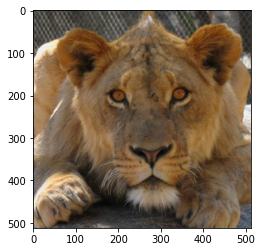

In [4]:
#Visualization of any one of the image

plt.imshow(images[10]);

In [5]:
#Shape of our image array

images.shape

(4738, 512, 512, 3)

##Creating an autoencoder using Convolutional layers:

In [18]:
def autoencoder_model(img_shape, code_size):
    H,W,C = img_shape
    
    # encoder
    encoder = keras.models.Sequential()
    encoder.add(L.InputLayer(img_shape))
    
    encoder.add(L.Conv2D(filters=32, kernel_size=(3, 3), activation='elu', padding='same'))
    encoder.add(L.MaxPooling2D(pool_size=(2, 2)))
    encoder.add(L.Conv2D(filters=64, kernel_size=(3, 3), activation='elu', padding='same'))
    encoder.add(L.MaxPooling2D(pool_size=(2, 2)))
    encoder.add(L.Conv2D(filters=128, kernel_size=(3, 3), activation='elu', padding='same'))
    encoder.add(L.MaxPooling2D(pool_size=(2, 2)))
    encoder.add(L.Conv2D(filters=256, kernel_size=(3, 3), activation='elu', padding='same'))
    encoder.add(L.MaxPooling2D(pool_size=(2, 2)))
    encoder.add(L.Flatten())                  #flatten image to vector
    encoder.add(L.Dense(code_size)) 
#     encoder.summary()

    # decoder
    decoder = keras.models.Sequential()
    decoder.add(L.InputLayer((code_size,)))
    
    decoder.add(L.Dense(32*32*256))  #actual decoder, height*width*3 units
    decoder.add(L.Reshape((32,32,256)))
    decoder.add(L.Conv2DTranspose(filters=128, kernel_size=(3, 3), strides=2, activation='elu', padding='same'))
    decoder.add(L.Conv2DTranspose(filters=64, kernel_size=(3, 3), strides=2, activation='elu', padding='same'))
    decoder.add(L.Conv2DTranspose(filters=32, kernel_size=(3, 3), strides=2, activation='elu', padding='same'))
    decoder.add(L.Conv2DTranspose(filters=3, kernel_size=(3, 3), strides=2, activation=None, padding='same'))
    
    return encoder, decoder

In [19]:
IMG_SHAPE = images.shape[1:]
IMG_SHAPE

(512, 512, 3)

In [20]:
##Summary Model for encoder and decoder i.e., our whole autoencoder model

encoder, decoder = autoencoder_model(IMG_SHAPE, code_size=32)
encoder.summary()
decoder.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 512, 512, 32)      896       
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 256, 256, 32)      0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 256, 256, 64)      18496     
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 128, 128, 64)      0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 128, 128, 128)     73856     
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 64, 64, 128)       0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 64, 64, 256)      

In [21]:
inp = L.Input(IMG_SHAPE)
code = encoder(inp)               #encoding
reconstruction = decoder(code)    #decoding
###Giving autoencoder
autoencoder = keras.models.Model(inputs=inp, outputs=reconstruction)
###Compiling our model using adam optimizer
autoencoder.compile(optimizer="adam", loss="mse")

In [22]:
###Fitting our model:

autoencoder.fit(x=images, y=images, epochs=100, verbose=1,
                callbacks=[tensorflow.keras.callbacks.EarlyStopping(monitor='loss', patience=100),
                           tensorflow.keras.callbacks.ModelCheckpoint('/content/sample_data/autoencoder_{loss:.4f}.h5',
                                                                      save_best_only=True,
                                                                      save_weights_only=False,
                                                                      monitor='loss')])

Epoch 1/100
149/149 [==============================] - 128s 859ms/step - loss: 4852.3970
Epoch 2/100
149/149 [==============================] - 127s 854ms/step - loss: 2415.0383
Epoch 3/100
149/149 [==============================] - 127s 852ms/step - loss: 2191.2068
Epoch 4/100
149/149 [==============================] - 127s 852ms/step - loss: 2084.1396
Epoch 5/100
149/149 [==============================] - 127s 852ms/step - loss: 1952.7377
Epoch 6/100
149/149 [==============================] - 127s 852ms/step - loss: 1904.9105
Epoch 7/100
149/149 [==============================] - 127s 851ms/step - loss: 1824.8451
Epoch 8/100
149/149 [==============================] - 127s 852ms/step - loss: 1739.2869
Epoch 9/100
149/149 [==============================] - 127s 851ms/step - loss: 1672.3125
Epoch 10/100
149/149 [==============================] - 127s 852ms/step - loss: 1581.4578
Epoch 11/100
149/149 [==============================] - 127s 851ms/step - loss: 1577.5651
Epoch 12/100
149/14

In [301]:
#autoencoder.save('/content/sample_data/autoencoder.h5')

In [26]:
#Loading the saved Autoencoder model

from tensorflow import keras
autoencoder = keras.models.load_model('/content/sample_data/autoencoder_732.3809.h5')

In [27]:
#Encoding our images

imagess = images
encoded_images = encoder.predict(imagess)

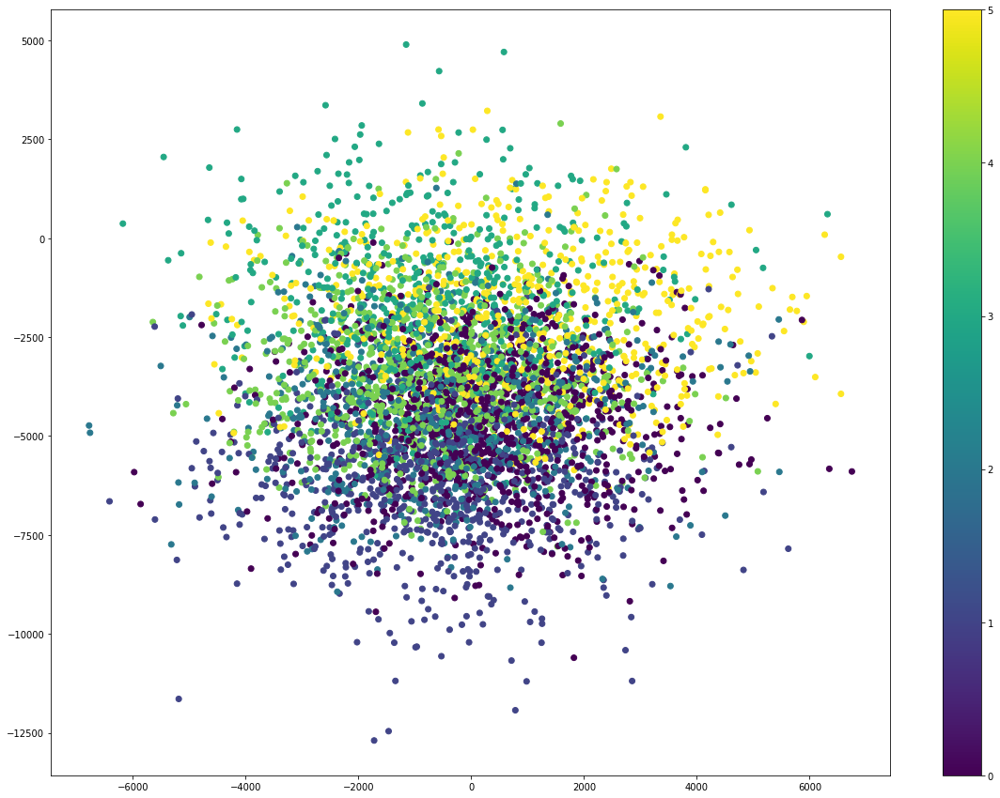

In [87]:
#Clustering using Kmeans:
#Assuming we have 6 classes:e.g. lion, tiger, cheetah, leopard, wolf, fox

from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=6)
kmeans.fit(encoded_images)
plt.figure(figsize=(20, 15))
plt.scatter(encoded_images[:, 0], encoded_images[:, 1], c=kmeans.labels_)
plt.colorbar()
plt.show()

In [29]:
###Fitting our encoded images on Nearest Neighbors algorithms to retrieve similar images

from sklearn.neighbors.unsupervised import NearestNeighbors
nei_clf = NearestNeighbors(metric="euclidean")
nei_clf.fit(encoded_images)

NearestNeighbors(algorithm='auto', leaf_size=30, metric='euclidean',
                 metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                 radius=1.0)

In [89]:
#Function for retrieving distances and indexes of similar images

def get_similar(image, n_neighbors):
    encoded_image = encoder.predict(image[None])
    #Getting distances and indexes of nearest neighbors
    (distances,),(idx,) = nei_clf.kneighbors(encoded_image,n_neighbors=n_neighbors)
    
    return distances,images[idx]

In [102]:

#Function for showing similar images:
def show_similar(image,n_neighbors):
    
    distances,neighbors = get_similar(image,n_neighbors)
    n_neighbor = n_neighbors-1 # for For loop
    dim = round(n_neighbors/2)
    #Plot for original image
    plt.figure(figsize=[30,30])
    plt.subplot(dim,dim,1)
    plt.imshow(image)
    plt.title("Original image")
    #Plot for neighbors
    for i in range(n_neighbor):
        plt.subplot(dim,dim,i+2)
        plt.imshow(neighbors[i+1])
        plt.title("Dist=%.3f"%distances[i+1])
    plt.show()

In [106]:
####Checking for various species

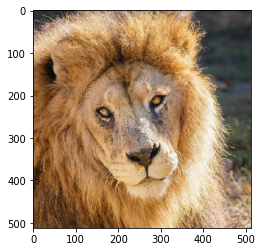

In [93]:
plt.imshow(imagess[41]);

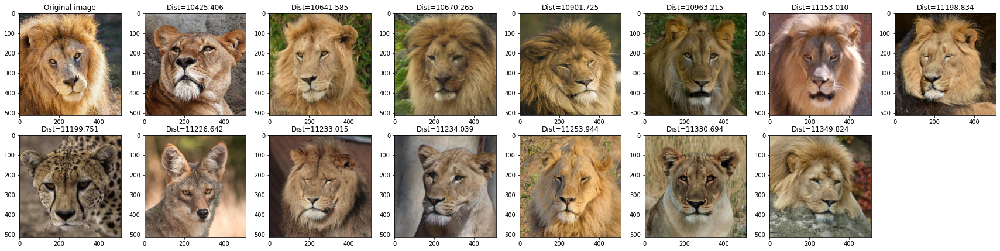

In [103]:
show_similar(imagess[41],15)

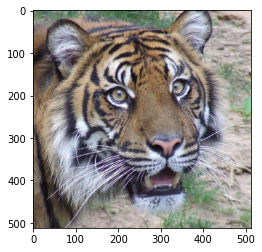

In [95]:
plt.imshow(imagess[209]);

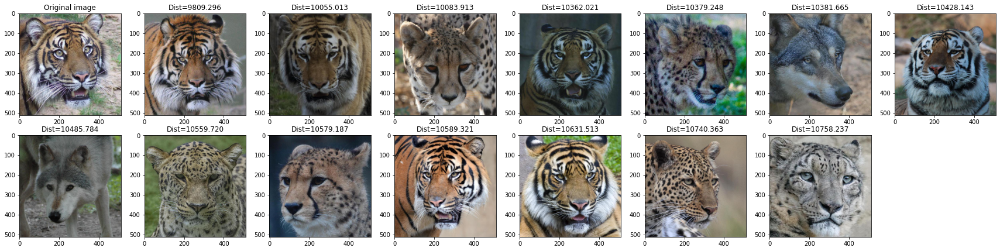

In [104]:
show_similar(imagess[209],15)

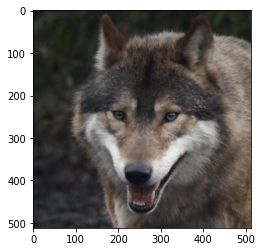

In [97]:
plt.imshow(imagess[93]);

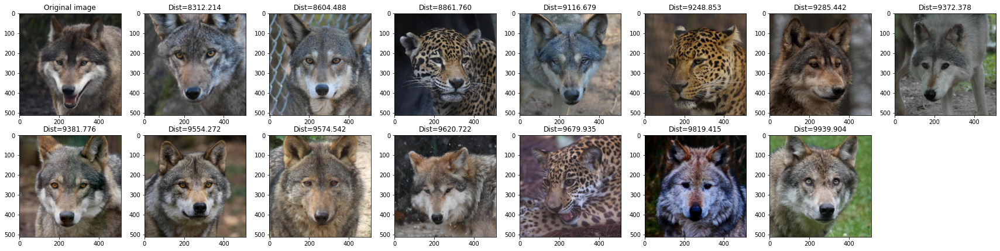

In [105]:
show_similar(imagess[93],15)

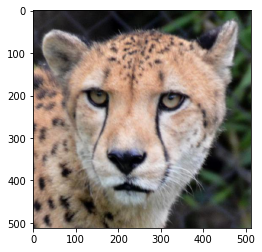

In [59]:
plt.imshow(imagess[107]);

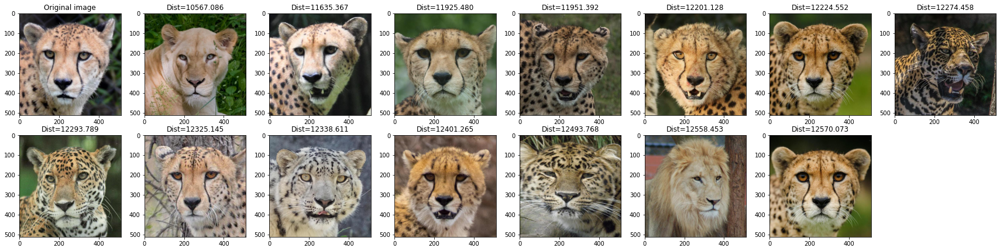

In [70]:
show_similar(imagess[107],15)

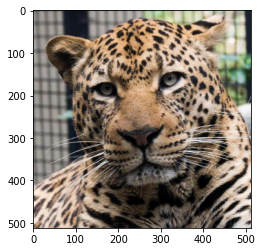

In [66]:
plt.imshow(imagess[57]);

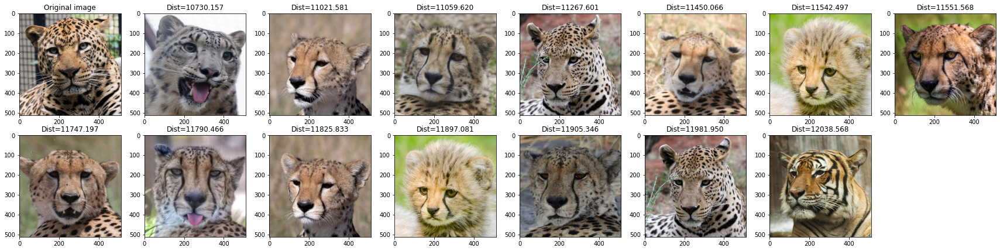

In [65]:
show_similar(imagess[57],15)

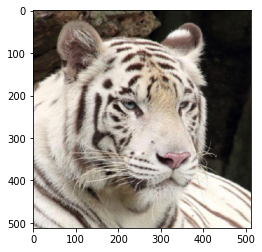

In [78]:
plt.imshow(imagess[14]);

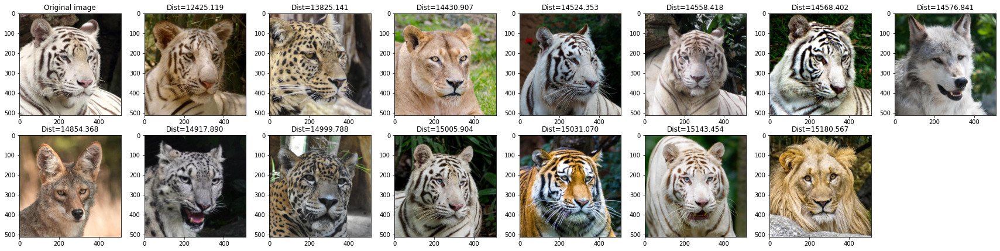

In [79]:
show_similar(imagess[14],15)

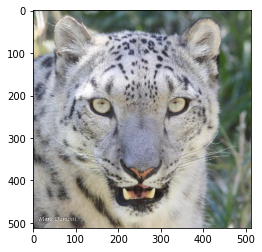

In [80]:
plt.imshow(imagess[18]);

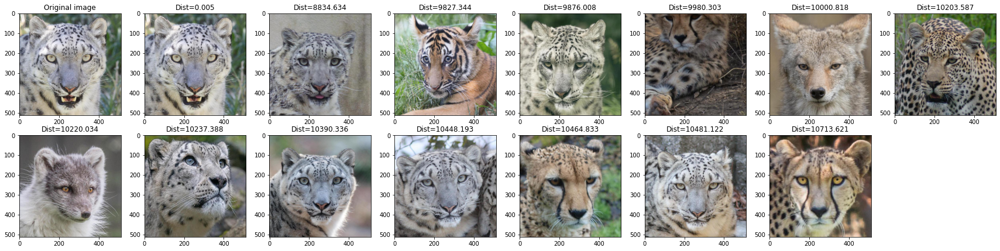

In [81]:
show_similar(imagess[18],15)